<a href="https://colab.research.google.com/github/ekrell/python-geo-plots/blob/main/geospatial_plotting_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Python for Geospatial Plotting

This notebook presents a brief introduction to a variety of geospatial plotting tasks.

A focus is on working with NetCDF data and point location to generate static, animated, and interactive visualizations.

**Task 1:** Plot monitoring locations

- Work with (lat, lon) point data
- Importance of setting coordinate reference system (CRS)
- Use GeoPandas for geospatial-aware tables
- Utilize remote data sources for basemaps

**Task 2:** Create maps from remote NetCDF data

- Import and explore remote NetCDF datasets
- Build a Triangular Irregular Network (TIN) using dataset variables
- Plot the TIN: water currents and water depth
- Plot a time series of water currents as
  - A sequence of subplots
  - An animated gif

**Task 3:** Plot time series data for point locations

- Given target coordinates, find nearest coordinates in NetCDF dataset
- Extract time series data from NetCDF into Pandas dataframe
- By specifying a datetime index, take advantage of Panda's time series tools

**Task 4:** Plot points on an interactive map

- Use folium to create an interactive map
- Can use mouse to zoom, click on points for additional info, etc
- Save the visualization as an HTML file that can be shared on the web


**Source:** Some of the NetCDF material heavily borrowed from: http://rsignell-usgs.github.io/blog/blog/2014/01/08/fvcom/


**Note on the Triangular Irregular Network (TIN)**

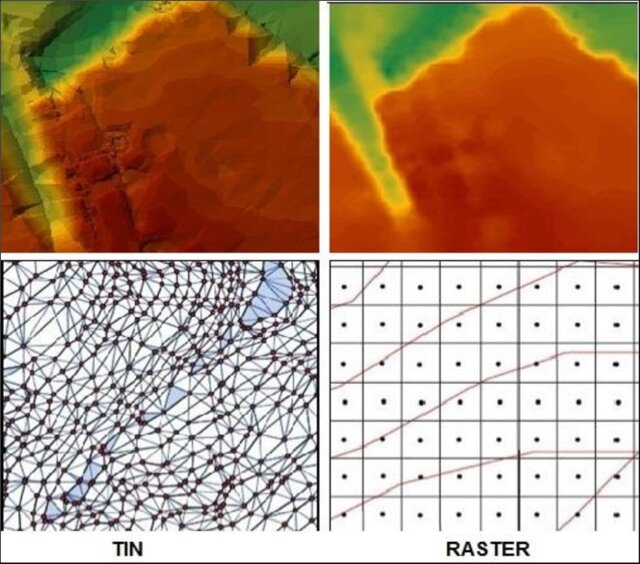

[Image source](https://www.researchgate.net/publication/303028182_The_contributions_of_the_three-dimensional_cartography_for_geomorphologic_studies_in_small_watersheds_of_the_Chapada_Diamantina_Brazil/figures?lo=1)

**Gridded Spatial Data:**

- Spatial data is very commonly stored as a gridded array of values
- This is called [raster data](https://datacarpentry.org/organization-geospatial/01-intro-raster-data.html#:~:text=Raster%20data%20is%20any%20pixelated,we%20represent%20any%20digital%20image.)
- It is very intuitive and easy to access the data you want: like playing Battleship
- But, if you have detailed information then you are forced to have a very large grid even for areas of your map that are less detailed

**Triangular Irregular Network (TIN):**

- Instead, what if you could store your data in a way where there were more points where you need it and less where you don't?
- One such method is with a TIN
- This is **not** a regulary grid, but a set of points and values
- The value at each point (besides those stored) is determined by triangulating the three points that enclose it
- [More info on TINs](https://gistbok.ucgis.org/bok-topics/2023-quarter-01/triangular-irregular-network-tin-models)

**I show the TIN data in this tutorial since it is less obvious how to deal with it. For rasters, it will just be some multi-dimensional array you can load directly into Numpy**

## Setup

In [3]:
from google.colab.output import eval_js

In [4]:
eval_js('google.colab.output.setIframeHeight("100")')  # Shrink the output cell height

# Python libraries not installed by default in Google Colab
!pip install geopandas
!pip install contextily
!pip install netCDF4

# Install a linux program for creating the animated gif
!apt-get update
!apt install imagemagick

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 55.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 24.5 MB/s eta 0:00:00
Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:2 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Get:4 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Hit:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Get:7 http://security.ubuntu.com/ubuntu jammy-security/universe amd64 Packages [1,064 kB]
Get:8 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease [18.1 kB]
Get:9 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [668 kB]
Get:10 http://security.ub

In [5]:
import netCDF4
import datetime as dt
from shapely.geometry import Point
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import contextily as cx
import matplotlib.tri as Tri
import numpy as np
import folium
from IPython.display import Image

**Options**

In [6]:
# Path to ocean model forecast outputs
nc_url = "http://www.smast.umassd.edu:8080/thredds/dodsC/FVCOM/NECOFS/Forecasts/NECOFS_FVCOM_OCEAN_MASSBAY_FORECAST.nc"

# Forecast hours to plot
hours_to_plot = [6, 12, 18, 24]

## Task 1: Plot monitoring locations

Here we generate this dataset manually, but it could be loaded from a Shapefile

**Define locations**

In [7]:
# Locations to plot
coords = [
    (42.318379, -70.981872),
    (42.303915, -70.924786),
    (42.354937, -70.970408),
    (42.330314, -70.935119),
]

# Define the coordinate system of these coordinates
coords_crs = "EPSG:4326" # This is a code for `WGS 84`, the longitude/latitude system based on Earth's curvature

Convert to geospatial dataframe using `GeoPandas`

In [8]:
# Explicity store the (lat, lon) coordinates as Point data
coords_ = [Point((coord[1], coord[0])) for coord in coords]
names = ["station {}".format(i) for i in range(len(coords_))]

c = {
    "Name" : names,
    "geometry" : coords_,
}

# Store as a spatial dataframe
gdf_stations = gpd.GeoDataFrame(c, crs=coords_crs)

gdf_stations

,Name,geometry
0,station 0,POINT (-70.98187 42.31838)
1,station 1,POINT (-70.92479 42.30392)
2,station 2,POINT (-70.97041 42.35494)
3,station 3,POINT (-70.93512 42.33031)


**Plot the points**

<Axes: >

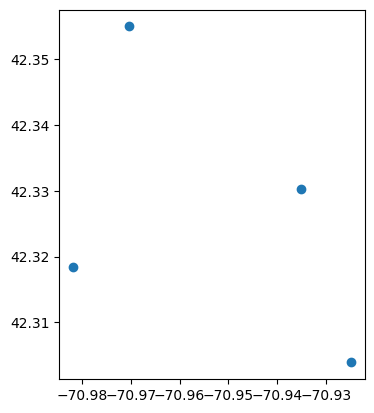

In [9]:
gdf_stations.plot()

**Plot the points on a base map**

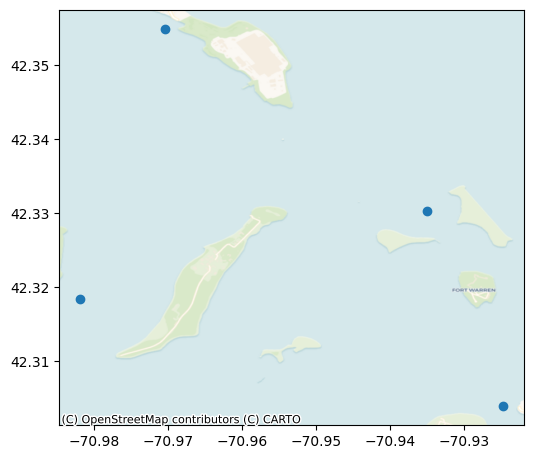

In [10]:
# Initialize figure
fig, ax = plt.subplots(figsize=(6, 6))

gdf_stations.plot(ax=ax)

# Add basemap using 'con
cx.add_basemap(ax,
               crs=gdf_stations.crs.to_string(),      # Automatically set crs using our geo dataframe
               source=cx.providers.CartoDB.Voyager, # Many options for the basemap
               )

**Calculate a bounding box for the points**

- Useful to know a geographic rectangle that contains the points
- Can add some padding to avoid the points being right in the edge

In [11]:
# Extract the latitudes, longitudes separately
lons = [(geo.x) for geo in gdf_stations["geometry"].values]
lats = [(geo.y) for geo in gdf_stations["geometry"].values]

padding_degrees = 0.01

def getBounds(x, y, padding):
  # Given 'x', 'y' coordinates and a padding distance,
  # calculate a bounding box

  # Calculate boundary points
  lower_left = Point((min(x) - padding_degrees, min(y) - padding_degrees))
  upper_left = Point((min(x) - padding_degrees, max(y) + padding_degrees))
  lower_right = Point((max(x) + padding_degrees, min(y) - padding_degrees))
  upper_right = Point((max(x) + padding_degrees, max(y) + padding_degrees))

  # We return the dictionary that could be used to make a geodataframe,
  # but stop short of doing so to make the function more generic
  # This way: (1) do not require pandas/geopandas, (2) do not require crs
  return {
      "bounds" : ["lower_left", "upper_left", "lower_right", "upper_right"],
      "geometry" : [lower_left, upper_left, lower_right, upper_right]
  }

bounds = getBounds(lons, lats, padding_degrees)

gdf_bounds = gpd.GeoDataFrame(bounds,
                              crs=gdf_stations.crs.to_string())

gdf_bounds

,bounds,geometry
0,lower_left,POINT (-70.99187 42.29392)
1,upper_left,POINT (-70.99187 42.36494)
2,lower_right,POINT (-70.91479 42.29392)
3,upper_right,POINT (-70.91479 42.36494)


**Plot the boundary points**

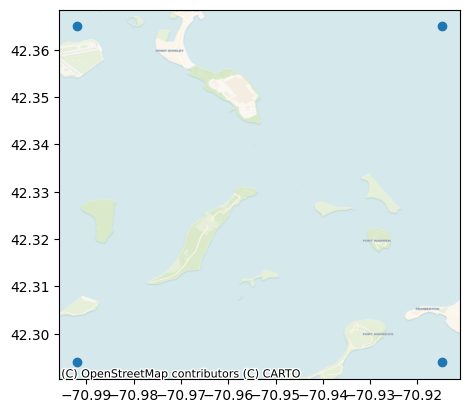

In [12]:
fig, ax = plt.subplots()
gdf_bounds.plot(ax=ax)
cx.add_basemap(ax, crs=gdf_bounds.crs.to_string(), source=cx.providers.CartoDB.Voyager)

**Add the stations, with invisible boundary points**

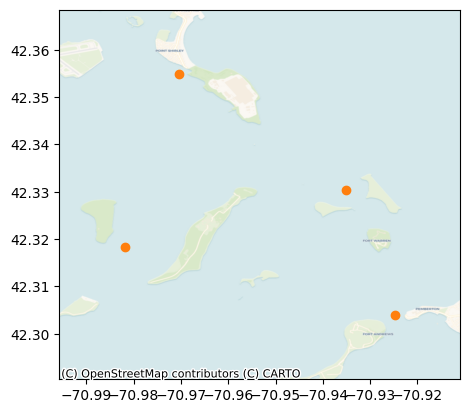

In [13]:
fig, ax = plt.subplots()
gdf_bounds.plot(ax=ax, alpha=0.0)
gdf_stations.plot(ax=ax)
cx.add_basemap(ax, crs=gdf_bounds.crs.to_string(), source=cx.providers.CartoDB.Voyager)

## Task 2: Create maps from remote NetCDF data

Given a remote data source, do the following:

1. Plot a single map with multiple variables
2. Plot a time-series as an animation

**Load dataset from remote source**

In [14]:
nc = netCDF4.Dataset(nc_url)

**Investigate dataset content**

First, plot some of the very basic metadata.

Besides giving potentially useful info, always good to make sure you loaded what you were expecting to load.

In [15]:
nc.title

'NECOFS Massachusetts (FVCOM) - Massachusetts Coastal - Latest Forecast'

In [16]:
# Access first element in the time data array
initial_time = nc["time"][:][0]
# Convert this numeric time code to an understandable Datetime object
initial_time = netCDF4.num2date(initial_time, nc["time"].units)

# Access last element in the time data array
final_time = nc["time"][:][-1]
final_time = netCDF4.num2date(final_time, nc["time"].units)

# Print with a specific format
print("Initial forecast time: ", initial_time.strftime('%Y-%b-%d %H:%M'))
print("Final forecast time:", final_time.strftime('%Y-%b-%d %H:%M'))

Initial forecast time:  2024-Feb-02 00:00
Final forecast time: 2024-Feb-08 00:00


Print all the variables & their metadata

The output has a lot of important information about the dimensions, units, etc. But is a little messy.

In [17]:
eval_js('google.colab.output.setIframeHeight("350")')  # Shrink the output cell height

nc_vars = nc.variables

var_names = [str(var) for var in nc_vars]

print("List of variables in NetCDF dataset:")
print(var_names)
print("\n\n")

print("Metadata for each variable:\n")
for var in nc_vars:
  print(nc_vars[var])
  print("\n")

List of variables in NetCDF dataset:
['x', 'y', 'lon', 'lat', 'xc', 'yc', 'lonc', 'latc', 'siglay', 'h', 'nv', 'time', 'Times', 'zeta', 'nbe', 'aw0', 'awx', 'awy', 'u', 'v', 'ww', 'ua', 'va', 'temp', 'salinity', 'fvcom_mesh']



Metadata for each variable:

<class 'netCDF4._netCDF4.Variable'>
float32 x(node)
    long_name: nodal x-coordinate
    units: meters
unlimited dimensions: 
current shape = (98432,)
filling off


<class 'netCDF4._netCDF4.Variable'>
float32 y(node)
    long_name: nodal y-coordinate
    units: meters
unlimited dimensions: 
current shape = (98432,)
filling off


<class 'netCDF4._netCDF4.Variable'>
float32 lon(node)
    long_name: nodal longitude
    standard_name: longitude
    units: degrees_east
unlimited dimensions: 
current shape = (98432,)
filling off


<class 'netCDF4._netCDF4.Variable'>
float32 lat(node)
    long_name: nodal latitude
    standard_name: latitude
    units: degrees_north
unlimited dimensions: 
current shape = (98432,)
filling off


<class 'net

Query metadata for a specific variable

In [18]:
var = "x"

if var in nc_vars:
  print(nc_vars["x"])
else:
  print("Could not find variable '{}' in dataset".format(var))

<class 'netCDF4._netCDF4.Variable'>
float32 x(node)
    long_name: nodal x-coordinate
    units: meters
unlimited dimensions: 
current shape = (98432,)
filling off


**Convert time offsets to specific timestamps**

In [19]:
timestamps = [initial_time + dt.timedelta(hours=hour) for hour in hours_to_plot]
timestamps

[cftime.DatetimeGregorian(2024, 2, 2, 6, 0, 0, 0, has_year_zero=False),
 cftime.DatetimeGregorian(2024, 2, 2, 12, 0, 0, 0, has_year_zero=False),
 cftime.DatetimeGregorian(2024, 2, 2, 18, 0, 0, 0, has_year_zero=False),
 cftime.DatetimeGregorian(2024, 2, 3, 0, 0, 0, 0, has_year_zero=False)]

**Convert first timestep to a numeric code that matches the NetCDF 'time' variable**

In [20]:
itime = netCDF4.date2index(timestamps[0],
                           nc["time"],
                           select="nearest"  # The dataset has a discrete set of times. This lets you get the nearest time to what you request
                           )

**Get the TIN**

There are two sets of (lat, lon) coordinates which can be confusing

- **Nodal:** these are the points of the TIN
- **Zonal:** these are for the vector fields (e.g. wind, water currents)

In [ ]:
# Nodal coordinates
lat = nc["lat"][:]
lon = nc["lon"][:]

# Zonal coordinates
latc = nc['latc'][:]
lonc = nc['lonc'][:]

# Get Connectivity array
nv = nc['nv'][:].T - 1

# Build triangulation
tri = Tri.Triangulation(lon, lat, triangles=nv)

**Find indices of coordinates within our geographic bounding box**

In [ ]:
bbox_idxs = np.argwhere((lonc >= float(gdf_bounds[gdf_bounds["bounds"] == "lower_left"]["geometry"].x)) & \
                     (lonc <= float(gdf_bounds[gdf_bounds["bounds"] == "lower_right"]["geometry"].x)) & \
                     (latc >= float(gdf_bounds[gdf_bounds["bounds"] == "lower_left"]["geometry"].y)) & \
                     (latc <= float(gdf_bounds[gdf_bounds["bounds"] == "upper_left"]["geometry"].y)))

**Get the variables that are represented by that network**

In [ ]:
# Get depth (bathymetry)
h = nc['h'][:]  # depth

# Get water currents
surface_currents_idx = 0   # Data has currents through water column, 0 at the top
u = nc['u'][itime, surface_currents_idx, :]
v = nc['v'][itime, surface_currents_idx, :]

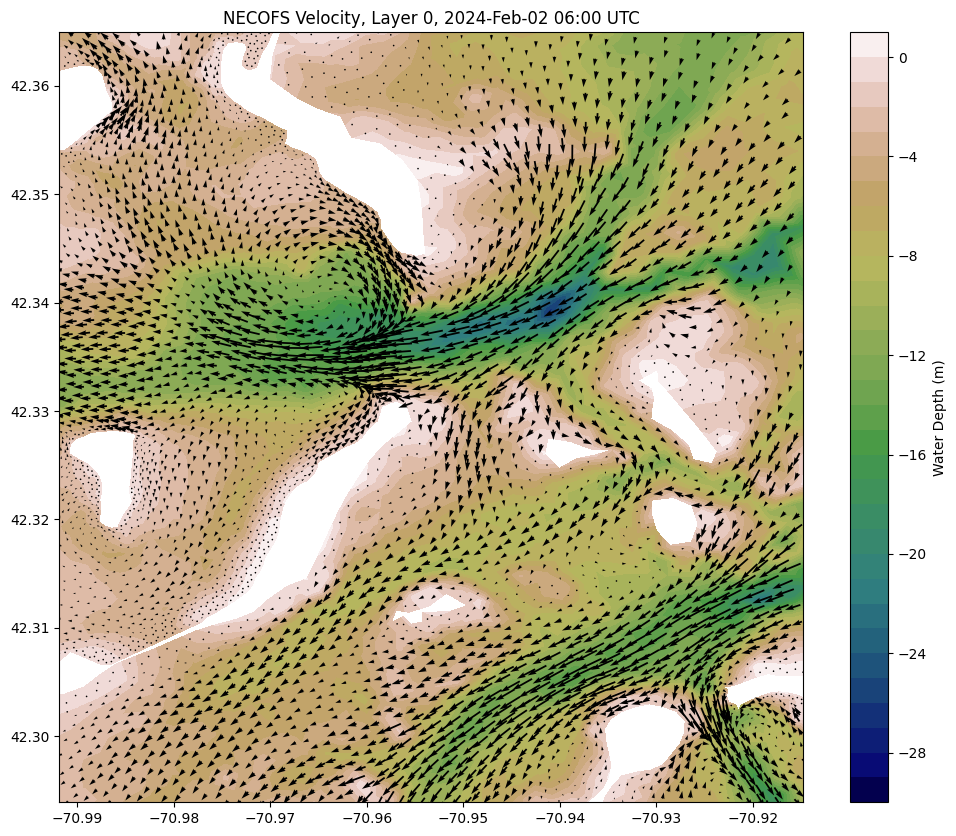

In [ ]:
fig, ax = plt.subplots(figsize=(12,10))

ax.set_ylim(float(gdf_bounds[gdf_bounds["bounds"] == "lower_left"]["geometry"].y), float(gdf_bounds[gdf_bounds["bounds"] == "upper_left"]["geometry"].y))
ax.set_xlim(float(gdf_bounds[gdf_bounds["bounds"] == "lower_left"]["geometry"].x), float(gdf_bounds[gdf_bounds["bounds"] == "lower_right"]["geometry"].x))

levels=np.arange(-30,2,1)

cf = ax.tricontourf(tri, -h, cmap=plt.cm.gist_earth, levels=levels)
cbar=plt.colorbar(cf)
cbar.set_label('Water Depth (m)')
Q = ax.quiver(lonc[bbox_idxs], latc[bbox_idxs], u[bbox_idxs], v[bbox_idxs], scale=20)
ax.set_title('NECOFS Velocity, Layer %d, %s UTC' % (surface_currents_idx, timestamps[0].strftime('%Y-%b-%d %H:%M')));

### Plot a sequence of time steps

Task: Given a list of time steps, plot the map (depth & water currents)

1. Put the above plotting code in a function
2. Populate subplot content in a loop

**Define function to plot a map, given a timestamp**

In [ ]:
def plotMap(itime, ax):

  dtime = netCDF4.num2date(nc.variables["time"][itime], nc.variables["time"].units)
  daystr = dtime.strftime('%Y-%b-%d %H:%M')

  # Get water current at timestamp
  u = nc['u'][itime, surface_currents_idx, :]
  v = nc['v'][itime, surface_currents_idx, :]

  # Set bounds
  ax.set_ylim(float(gdf_bounds[gdf_bounds["bounds"] == "lower_left"]["geometry"].y), float(gdf_bounds[gdf_bounds["bounds"] == "upper_left"]["geometry"].y))
  ax.set_xlim(float(gdf_bounds[gdf_bounds["bounds"] == "lower_left"]["geometry"].x), float(gdf_bounds[gdf_bounds["bounds"] == "lower_right"]["geometry"].x))

  # Add depth contours
  levels=np.arange(-30,2,1)
  cf = ax.tricontourf(tri, -h, cmap=plt.cm.gist_earth, levels=levels)
  # cbar=plt.colorbar(cf)
  # cbar.set_label('Water Depth (m)')

  # Add water currents
  Q = ax.quiver(lonc[bbox_idxs], latc[bbox_idxs], u[bbox_idxs], v[bbox_idxs], scale=20)

  # Title
  ax.set_title('NECOFS Velocity, Layer %d, %s UTC' % (surface_currents_idx, dtime.strftime('%Y-%b-%d %H:%M')));

  return cf


**Test with a single plot**

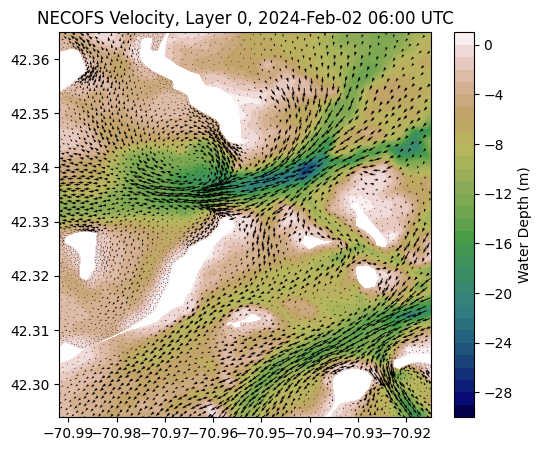

In [ ]:
fig, ax = plt.subplots(figsize=(6,5))
cf = plotMap(itime, ax)
cbar=plt.colorbar(cf)
cbar.set_label('Water Depth (m)')

**Plot a timestamp sequence**

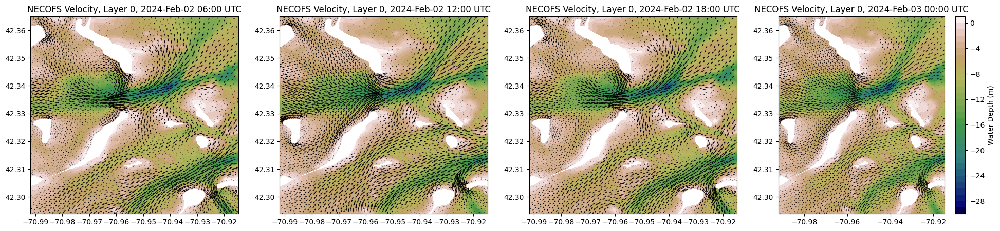

In [ ]:
# Calc number of subplots to generate
n_times = len(timestamps)

# Convert human-understandable timestamps to indices of the 'time' variable
itimes = [netCDF4.date2index(timestamp, nc.variables["time"], select = "nearest") for timestamp in timestamps]

fig, axs = plt.subplots(1,                          # Number of rows
                        n_times,                    # Number of columns
                        figsize=(6 * n_times, 5),   # Stretch the x-axis by the number of plots
                        squeeze=False)              # Squeeze is important. Else, will flatten the dimensions causing loop to fail

# For each timestamp
for i in range(n_times):
  # Plot to map to a subplot
  cf = plotMap(itimes[i], axs[0][i])

# Add colorbar
cbar=plt.colorbar(cf)
cbar.set_label('Water Depth (m)')

### Create an animated time series gif

**Generate a sequence of time indices**

In [ ]:
# Use number of time data points to get all indices
all_itimes = np.array(range(len(nc["time"][:])))

# Select to go from hourly to every 4th hour
selected_itimes = all_itimes[::4]
n_selected = len(selected_itimes)

print("Will plot {} timestamps".format(n_selected))

Will plot 37 timestamps


**Generate a sequence of output filenames**

In [ ]:
frame_filenames = ["velocity_frame_{}.png".format(i) for i in range(n_selected)]

In [ ]:
%%capture

# For each timestamp
for i, itime in enumerate(selected_itimes):

  # Plot to map to a subplot
  fig, ax = plt.subplots(figsize=(6,5));
  cf = plotMap(itime, ax);
  cbar=plt.colorbar(cf);
  cbar.set_label('Water Depth (m)');

  plt.savefig(frame_filenames[i]);
  plt.close()

**Check the current working directory to see the saved files**

In [ ]:
!ls

sample_data	       velocity_frame_18.png  velocity_frame_27.png  velocity_frame_36.png
velocity_frame_0.png   velocity_frame_19.png  velocity_frame_28.png  velocity_frame_3.png
velocity_frame_10.png  velocity_frame_1.png   velocity_frame_29.png  velocity_frame_4.png
velocity_frame_11.png  velocity_frame_20.png  velocity_frame_2.png   velocity_frame_5.png
velocity_frame_12.png  velocity_frame_21.png  velocity_frame_30.png  velocity_frame_6.png
velocity_frame_13.png  velocity_frame_22.png  velocity_frame_31.png  velocity_frame_7.png
velocity_frame_14.png  velocity_frame_23.png  velocity_frame_32.png  velocity_frame_8.png
velocity_frame_15.png  velocity_frame_24.png  velocity_frame_33.png  velocity_frame_9.png
velocity_frame_16.png  velocity_frame_25.png  velocity_frame_34.png
velocity_frame_17.png  velocity_frame_26.png  velocity_frame_35.png


**Inspect a single frame**

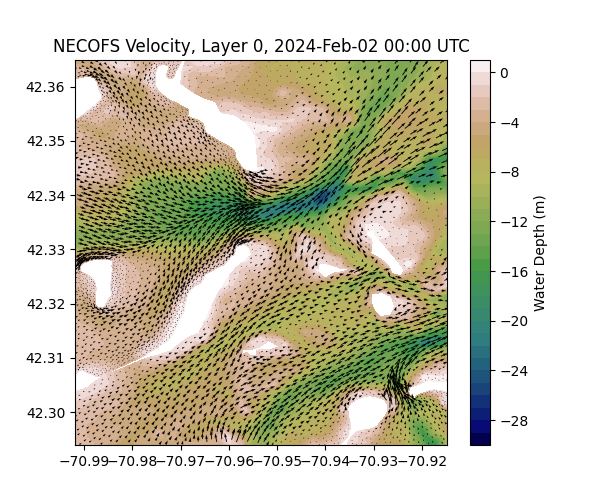

In [ ]:
Image('velocity_frame_0.png')

**Combine frames to create animated gif**

- Also possible to do this directly with python
- But I prefer to output all frames & combine after
- This way, I could load frames into an editor (i.e. Inkscape) for further customization

In [ ]:
!convert -delay 50 velocity_frame_*.png velocity_animation_wrong.gif

**Show the animation... but why is the frame order wrong?!**

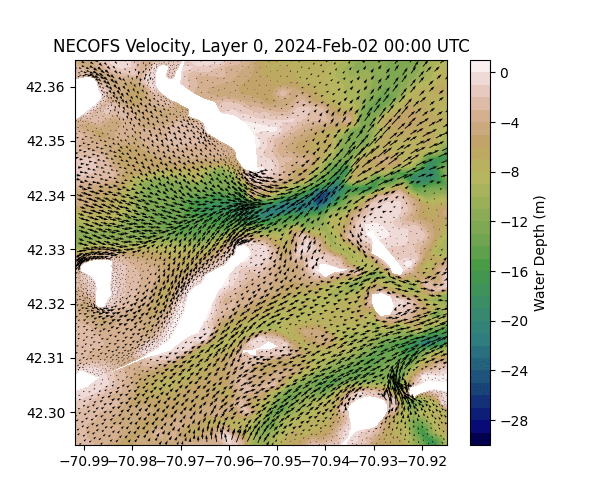

In [ ]:
Image('velocity_animation_wrong.gif')

**Try again, with correct numeric ordering**

In [ ]:
# Will rely on the `-v` option to get numeric ordering
!ls -v velocity_frame_*.png

velocity_frame_0.png  velocity_frame_10.png  velocity_frame_20.png  velocity_frame_30.png
velocity_frame_1.png  velocity_frame_11.png  velocity_frame_21.png  velocity_frame_31.png
velocity_frame_2.png  velocity_frame_12.png  velocity_frame_22.png  velocity_frame_32.png
velocity_frame_3.png  velocity_frame_13.png  velocity_frame_23.png  velocity_frame_33.png
velocity_frame_4.png  velocity_frame_14.png  velocity_frame_24.png  velocity_frame_34.png
velocity_frame_5.png  velocity_frame_15.png  velocity_frame_25.png  velocity_frame_35.png
velocity_frame_6.png  velocity_frame_16.png  velocity_frame_26.png  velocity_frame_36.png
velocity_frame_7.png  velocity_frame_17.png  velocity_frame_27.png
velocity_frame_8.png  velocity_frame_18.png  velocity_frame_28.png
velocity_frame_9.png  velocity_frame_19.png  velocity_frame_29.png


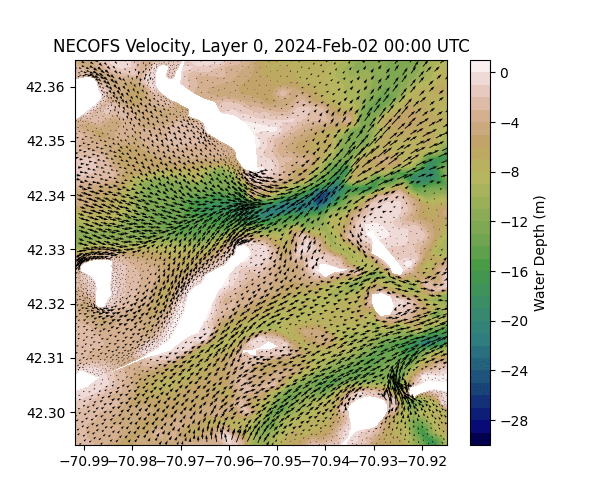

In [ ]:
!convert -delay 50 `ls -v velocity_frame_*.png` velocity_animation.gif
Image('velocity_animation.gif')

## Task 3: Plot time series data for point locations

- Given our station locations, plot time series data

**Find nearest (lat, lon) in dataset to the target station**

- Our list of stations was created manually (arbitrary coordinates)
- There is a discrete sequence of (lat, lon) coordinates in the NetCDF dataset
- Must find closest dataset (lat, lon) to target (lat, lon)

In [ ]:
def getNearestLocation(target_lat, target_lon, lats, lons):
  dist = np.sqrt((lats - target_lat)**2 + (lons - target_lon)**2)
  nearest_idx = dist.argmin()
  nearest_dist = dist.min()
  return nearest_idx, nearest_dist

In [ ]:
nearest = np.array([getNearestLocation(gdf_stations.iloc[i]["geometry"].y, gdf_stations.iloc[i]["geometry"].x, lat, lon) for i in range(len(gdf_stations))])

In [ ]:
gdf_stations["nearest_nc_idx"] = nearest[:, 0].astype("int")
gdf_stations["nearest_nc_distance"] = nearest[:, 1]

gdf_stations

,Name,geometry,nearest_nc_idx,nearest_nc_distance
0,station 0,POINT (-70.98187 42.31838),71189,0.000408
1,station 1,POINT (-70.92479 42.30392),57717,0.000583
2,station 2,POINT (-70.97041 42.35494),66297,0.000368
3,station 3,POINT (-70.93512 42.33031),51946,0.000484


In [ ]:
# Get salinity
surface_salinity_idx = 0
salinity = nc["salinity"][:, surface_currents_idx, :]

In [ ]:
# Get all time steps salinity data at each station location
salinity_stations = salinity[:, gdf_stations["nearest_nc_idx"].values]

In [ ]:
# Create DataFrame where each row is a time step, each column a station
df_salinity = pd.DataFrame(salinity_stations)
df_salinity

# Column names from each stations
df_salinity.columns = gdf_stations["Name"].values

# Add column with time index
df_salinity["itime"] = nc["time"][:]

# Replace index with datetime object
df_salinity["datetime"] = netCDF4.num2date(df_salinity["itime"].values, nc.variables["time"].units, only_use_cftime_datetimes=False)
df_salinity = df_salinity.set_index("datetime")
df_salinity.index = pd.to_datetime(df_salinity.index)

df_salinity

,station 0,station 1,station 2,station 3,itime
datetime,,,,,
2024-02-02 00:00:00.000,29.588064,31.679014,30.258892,31.117043,60342.000000
2024-02-02 01:01:52.500,29.043472,31.678988,30.307184,31.087851,60342.042969
2024-02-02 01:58:07.500,28.705166,31.677366,30.352432,31.285124,60342.082031
2024-02-02 03:00:00.000,28.790117,31.611521,30.361717,31.452705,60342.125000
2024-02-02 04:01:52.500,28.625311,31.680904,30.326891,30.763987,60342.167969
...,...,...,...,...,...
2024-02-07 19:58:07.500,29.221031,31.450737,30.318106,31.296165,60347.832031
2024-02-07 21:00:00.000,28.998077,31.471338,30.343214,29.919083,60347.875000
2024-02-07 22:01:52.500,27.712729,31.401091,30.435593,30.095842,60347.917969


**Plot time series**

Text(0, 0.5, 'Salinity')

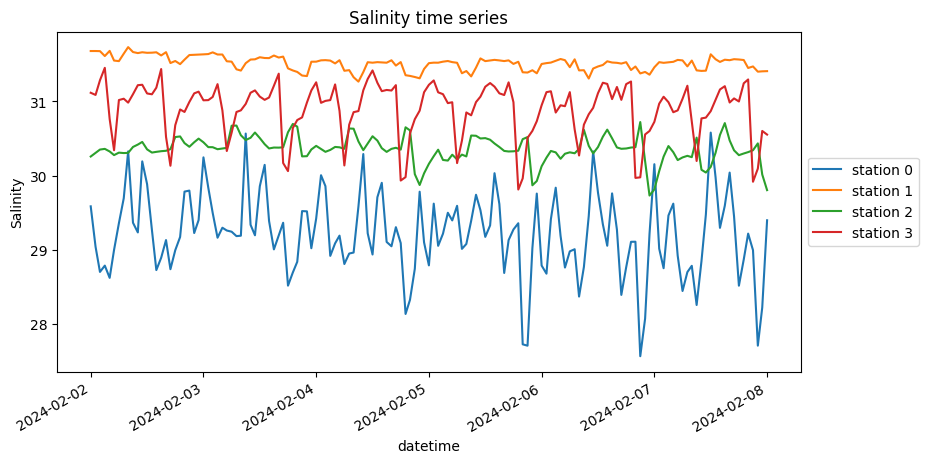

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))
df_salinity.plot(y=gdf_stations["Name"].values, ax=ax)

# Move the legend outside the axis
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5));
plt.title("Salinity time series")
plt.ylabel("Salinity")

**Rolling means**

Plot the 6-hour rolling average

Text(0, 0.5, 'Salinity')

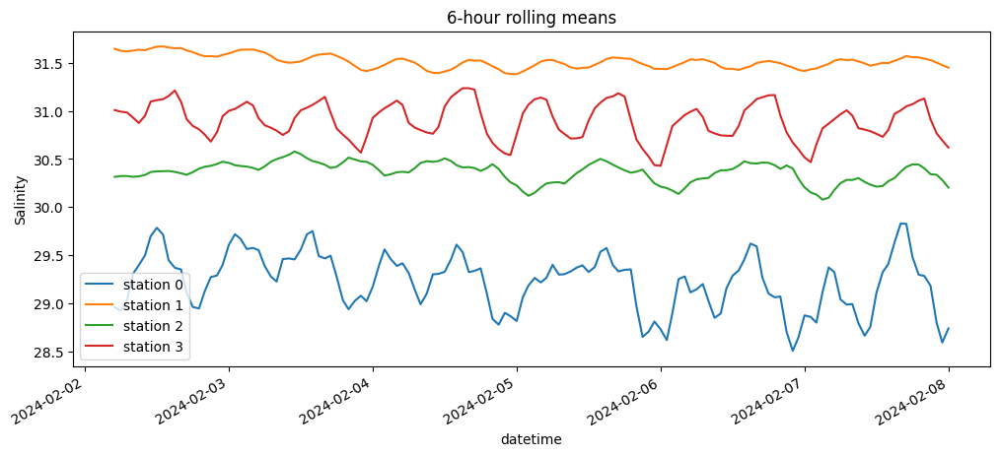

In [ ]:
# Calculate rolling values
df_salinity_rolling = df_salinity.rolling(6).mean()

# Plot rolling mean
fig, ax = plt.subplots(figsize=(12,5))
df_salinity_rolling.plot(y=gdf_stations["Name"].values, ax=ax)
plt.title("6-hour rolling means")
plt.ylabel("Salinity")

### Plot pandas daily means

Text(0, 0.5, 'Salinity')

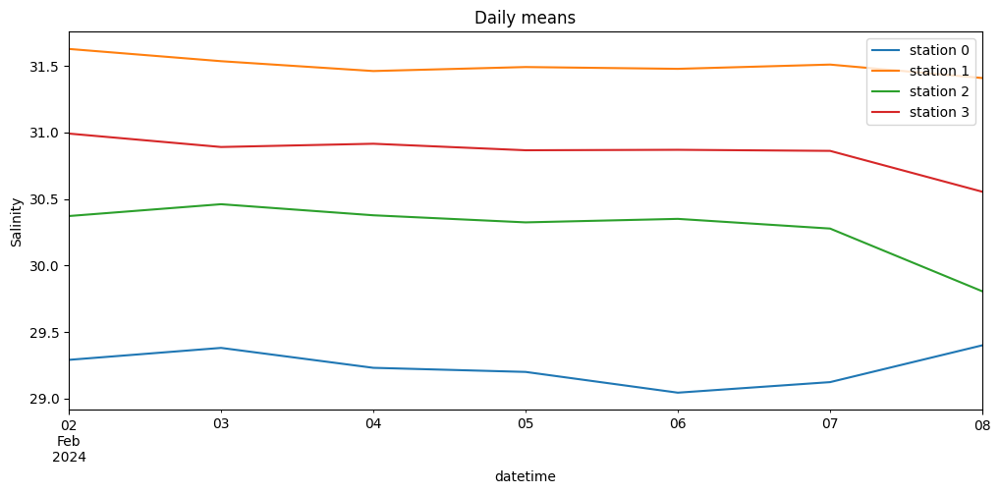

In [ ]:
# Resample to daily
df_salinity_daily = df_salinity.resample("D").mean()

# Plot rolling mean
fig, ax = plt.subplots(figsize=(12,5))
df_salinity_daily.plot(y=gdf_stations["Name"].values, ax=ax)
plt.title("Daily means")
plt.ylabel("Salinity")

## Task 4: Create an interactive map

- The `folium` library is an easy way to create interactive maps
- Here, I just show a tiny example to give a taste of what can be done
- See the documentation for many examples: https://python-visualization.github.io/folium/quickstart.html

**Initialize map with center location**

In [ ]:
# Calculate a map center location
center_lat = float(gdf_bounds[gdf_bounds["bounds"] == "lower_left"]["geometry"].y) + \
    (float(gdf_bounds[gdf_bounds["bounds"] == "upper_left"]["geometry"].y) - \
    float(gdf_bounds[gdf_bounds["bounds"] == "lower_left"]["geometry"].y)) * 0.5
center_lon = float(gdf_bounds[gdf_bounds["bounds"] == "upper_left"]["geometry"].x) + \
    (float(gdf_bounds[gdf_bounds["bounds"] == "upper_right"]["geometry"].x) - \
    float(gdf_bounds[gdf_bounds["bounds"] == "lower_left"]["geometry"].x)) * 0.5

**Calculate data to add to icon pop ups**

When you click point on the map, can get extra information

In [ ]:
df_salinity.drop("itime", axis=1)

,station 0,station 1,station 2,station 3
datetime,,,,
2024-02-02 00:00:00.000,29.588064,31.679014,30.258892,31.117043
2024-02-02 01:01:52.500,29.043472,31.678988,30.307184,31.087851
2024-02-02 01:58:07.500,28.705166,31.677366,30.352432,31.285124
2024-02-02 03:00:00.000,28.790117,31.611521,30.361717,31.452705
2024-02-02 04:01:52.500,28.625311,31.680904,30.326891,30.763987
...,...,...,...,...
2024-02-07 19:58:07.500,29.221031,31.450737,30.318106,31.296165
2024-02-07 21:00:00.000,28.998077,31.471338,30.343214,29.919083
2024-02-07 22:01:52.500,27.712729,31.401091,30.435593,30.095842


In [ ]:
df_salinity

,station 0,station 1,station 2,station 3,itime
datetime,,,,,
2024-02-02 00:00:00.000,29.588064,31.679014,30.258892,31.117043,60342.000000
2024-02-02 01:01:52.500,29.043472,31.678988,30.307184,31.087851,60342.042969
2024-02-02 01:58:07.500,28.705166,31.677366,30.352432,31.285124,60342.082031
2024-02-02 03:00:00.000,28.790117,31.611521,30.361717,31.452705,60342.125000
2024-02-02 04:01:52.500,28.625311,31.680904,30.326891,30.763987,60342.167969
...,...,...,...,...,...
2024-02-07 19:58:07.500,29.221031,31.450737,30.318106,31.296165,60347.832031
2024-02-07 21:00:00.000,28.998077,31.471338,30.343214,29.919083,60347.875000
2024-02-07 22:01:52.500,27.712729,31.401091,30.435593,30.095842,60347.917969


In [ ]:
gdf_stations["salinity_mean"] = df_salinity.drop("itime", axis=1).mean().values
gdf_stations["salinity_min"] = df_salinity.drop("itime", axis=1).min().values
gdf_stations["salinity_max"] = df_salinity.drop("itime", axis=1).max().values

gdf_stations

,Name,geometry,nearest_nc_idx,nearest_nc_distance,salinity_mean,salinity_min,salinity_max
0,station 0,POINT (-70.98187 42.31838),71189,0.000408,29.213335,27.570574,30.580719
1,station 1,POINT (-70.92479 42.30392),57717,0.000583,31.515854,31.266953,31.731632
2,station 2,POINT (-70.97041 42.35494),66297,0.000368,30.356247,29.733482,30.722565
3,station 3,POINT (-70.93512 42.33031),51946,0.000484,30.896181,29.814390,31.452705


**Add stations to map**

In [ ]:
# Initialize map
m = folium.Map((center_lat, center_lon), zoom_start=12)

# Add points to map
for i in range(len(gdf_stations)):
  station = gdf_stations.iloc[i]

  name = station["Name"]

  lat = station["geometry"].y
  lon = station["geometry"].x

  popup = "Salinity <br> min:{:.3f}ppm <br> mean:{:.3f}ppm <br> max:{:.3f}ppm".format(station["salinity_min"], station["salinity_mean"], station["salinity_max"])
  folium.Marker(
      [lat, lon],
      icon=folium.Icon(color="purple", icon="info-sign"),
      popup=popup,
      tooltip=name
  ).add_to(m)

In [ ]:
m

**Save map as HTML webpage**

In [ ]:
m.save("stations.html")